In [0]:
%matplotlib inline
import pandas as pd
import glob
import networkx as nx
import matplotlib.pyplot as plt
import requests
import io
import numpy as np

In [0]:
# Prepare plot data

def prepare_plot_data(start_date, end_date, db, top_targets):
  mask = (db['TIMESTAMP'] >= start_date) & (db['TIMESTAMP'] <= end_date)
  db_for_graph = db.loc[mask]
  temp_db = db_for_graph.loc[db_for_graph['TARGET_SUBREDDIT'].isin(top_targets)]
  title = "Top 20 Subreddits from " + start_date + " to " + end_date
  plot_node_link_diagram(temp_db, top_targets, title)


def plot_node_link_diagram(temp_db, top_targets, title):
  plt.figure(figsize=(50, 50))
  # 1. Create the graph using edgelist
  g = nx.from_pandas_edgelist(temp_db, 'SOURCE_SUBREDDIT', 'TARGET_SUBREDDIT')
  # 2. Create a layout for our nodes 
  layout = nx.spring_layout(g,iterations=50)

  # 3. Draw the parts we want
  # Edges thin and grey
  # Source subreddits are small and grey
  # Target subreddits sized according to their number of connections
  # Labels for Target Subreddits ONLY
  # Source Subreddits which are highly connected are a highlighted color

  # Go through every Subreddit name, ask the graph how many
  # connections it has. Multiply that by 80 to get the circle size
  nd_size = [g.degree(x) * 80 for x in top_targets]
  nx.draw_networkx_nodes(g, 
                        layout, 
                        nodelist=top_targets,
                        node_size=nd_size, # a LIST of sizes, based on g.degree
                        node_color='lightgreen')

  # Draw EVERYONE
  nx.draw_networkx_nodes(g, layout, nodelist=temp_db['SOURCE_SUBREDDIT'], node_color='#cccccc', node_size=100)

  # Draw popular Source Subreddits
  popular_people = [source for source in temp_db['SOURCE_SUBREDDIT'] if g.degree(source) > 1]
  nx.draw_networkx_nodes(g, layout, nodelist=popular_people, node_color='orange', node_size=100)

  nx.draw_networkx_edges(g, layout, width=1, edge_color="#cccccc")

  node_labels = dict(zip(temp_db['TARGET_SUBREDDIT'], temp_db['TARGET_SUBREDDIT']))
  nx.draw_networkx_labels(g, layout, labels=node_labels)

  # 4. Turn off the axis because I know you don't want it
  plt.axis('off')

  plt.title(title)

  # 5. Tell matplotlib to show it
  plt.show()

In [0]:
url="https://snap.stanford.edu/data/soc-redditHyperlinks-body.tsv"
s=requests.get(url).content
db=pd.read_csv(io.StringIO(s.decode('utf-8')), delimiter='\t')

In [0]:
g_data=nx.from_pandas_edgelist(db,'SOURCE_SUBREDDIT', 'TARGET_SUBREDDIT')

In [0]:
nx.write_adjlist(g_data,"test.adjlist")

In [0]:
f = list(db['SOURCE_SUBREDDIT'].values)
f.extend(db['TARGET_SUBREDDIT'].values)
len(f)

573122

In [0]:
lset = set(f)

In [0]:
# Unique Subreddits in the dataset
len(lset)

35776

In [0]:
data = [] 
for x in lset:
  data.extend([[x, g_data.degree(x)]])

df = pd.DataFrame(data, columns = ['Name', 'degree'])
top_20 = df.sort_values(by='degree', ascending=False).head(20)

In [0]:
# Fetch only Top 20 Subreddits based on their degree
top_targets = list(df.sort_values(by='degree', ascending=False).head(20)['Name'])

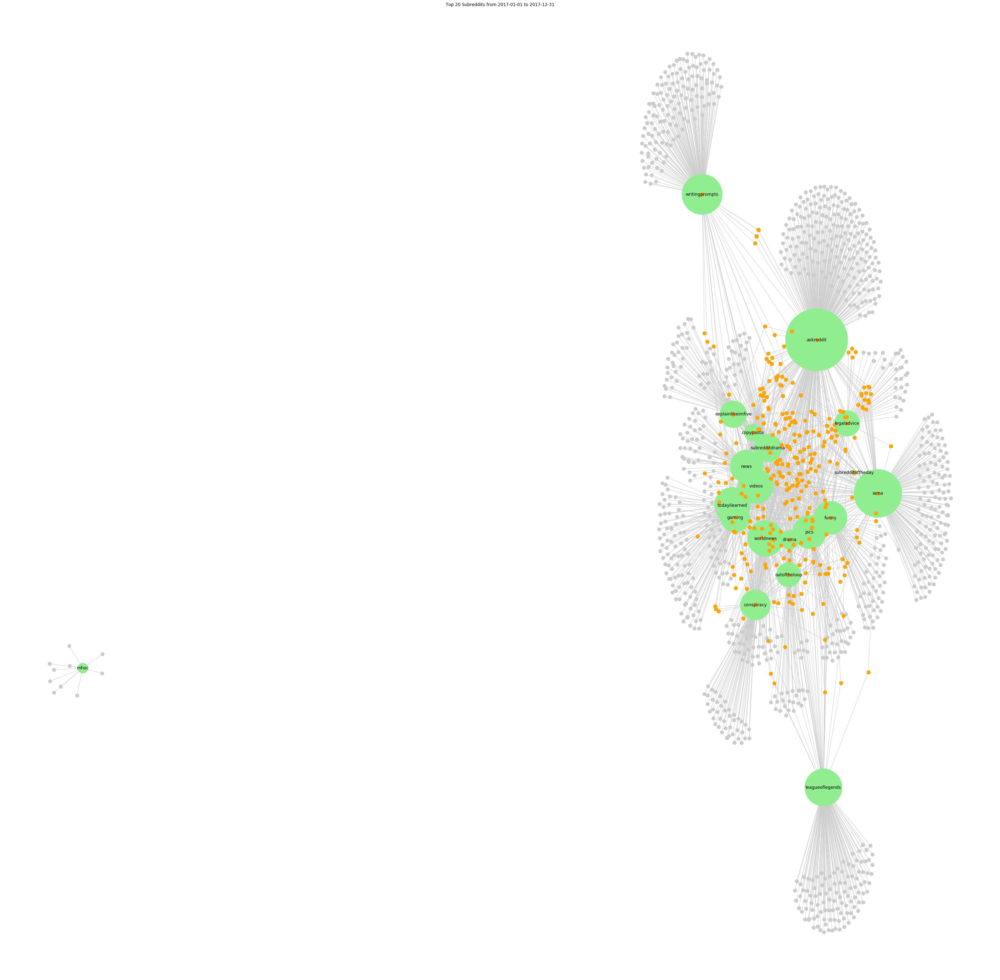

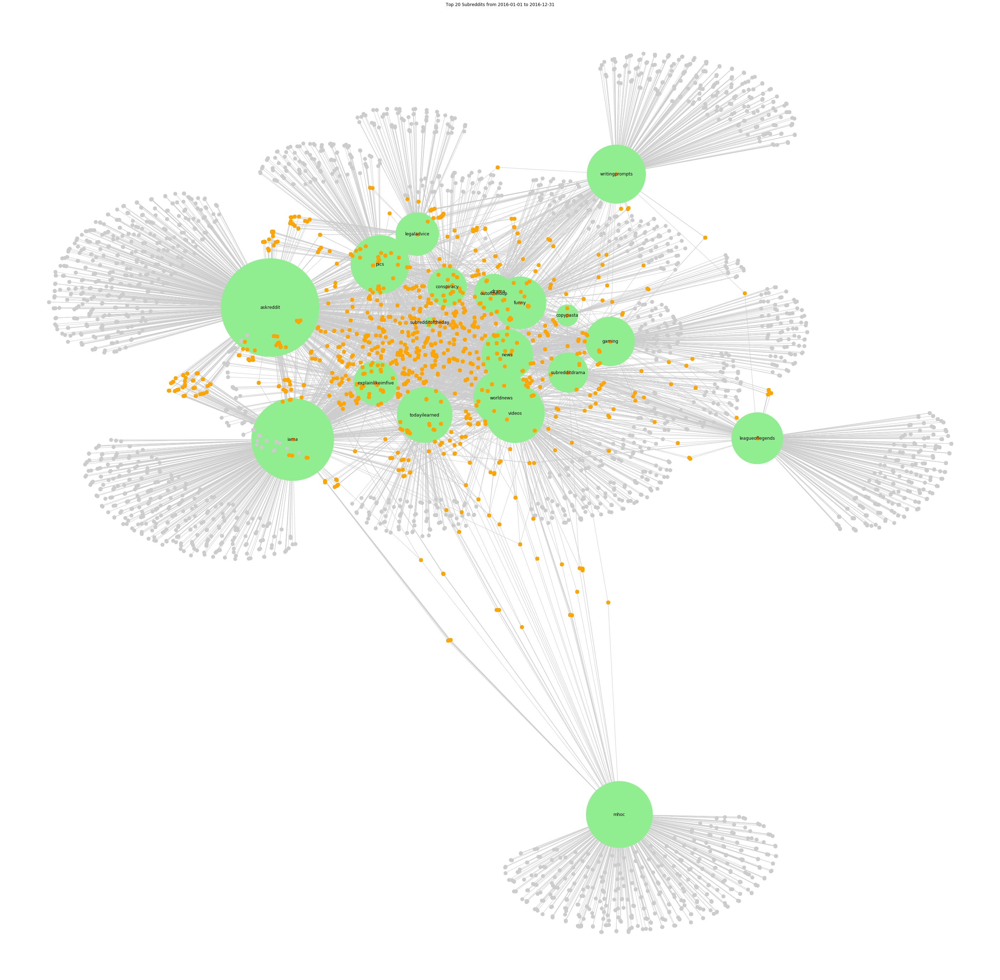

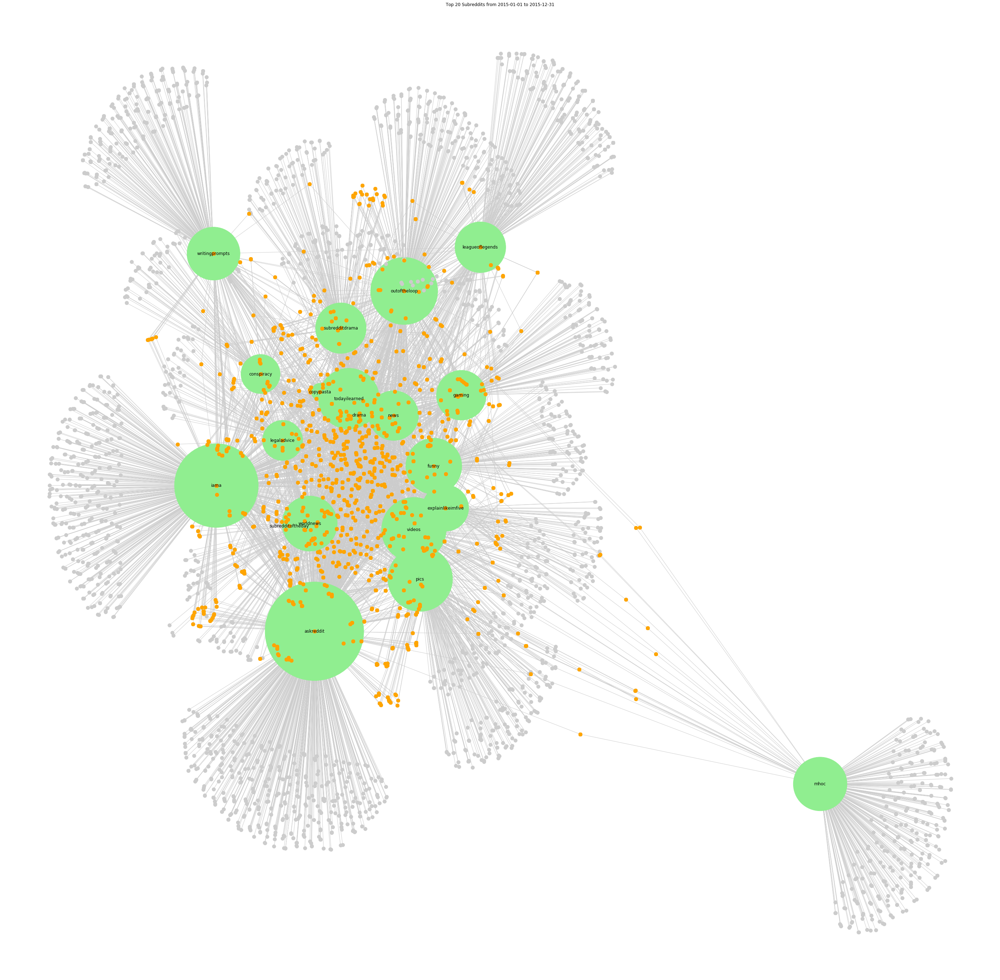

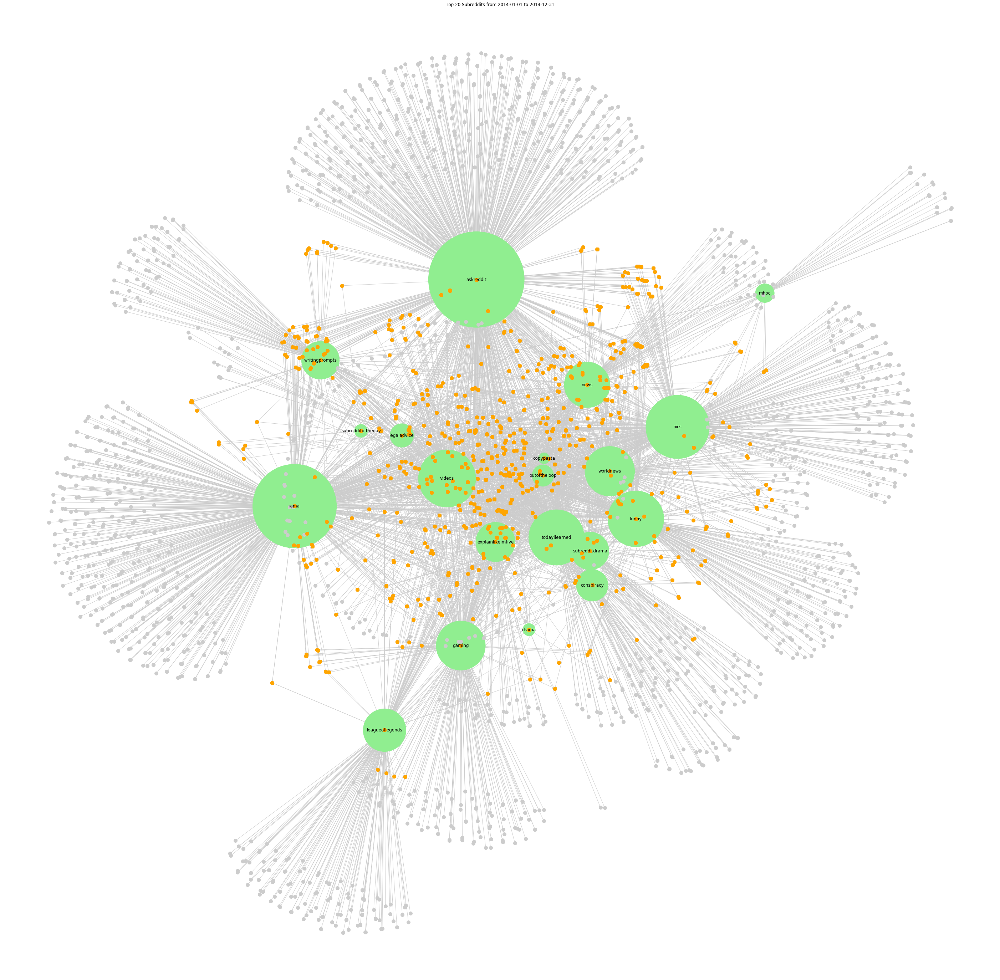

In [0]:
prepare_plot_data('2017-01-01', '2017-12-31', db, top_targets)
prepare_plot_data('2016-01-01', '2016-12-31', db, top_targets)
prepare_plot_data('2015-01-01', '2015-12-31', db, top_targets)
prepare_plot_data('2014-01-01', '2014-12-31', db, top_targets)

In [0]:
# Adjacency Matrix of Top 20 Target Subreddits
# Execution Time: 519.856 Secs = 8.66 Minutes for entire dataset
am = pd.DataFrame(np.zeros(shape=(20,20)), columns=top_targets, index=top_targets)

for x in top_targets:
  for y in list(db[db['SOURCE_SUBREDDIT'] == x]['TARGET_SUBREDDIT']):
    if y == x:
      am.at[x, y] += 1

In [0]:
am

,askreddit,iama,subredditdrama,writingprompts,outoftheloop,pics,videos,todayilearned,funny,gaming,leagueoflegends,copypasta,conspiracy,worldnews,drama,explainlikeimfive,mhoc,legaladvice,news,subredditoftheday
askreddit,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
iama,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
subredditdrama,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
writingprompts,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
outoftheloop,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
pics,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
videos,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
todayilearned,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
funny,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
gaming,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
# Adjacency List
db[db['SOURCE_SUBREDDIT'].isin(top_targets)].groupby('SOURCE_SUBREDDIT')['TARGET_SUBREDDIT'].apply(lambda x: set(x.tolist()))

SOURCE_SUBREDDIT
askreddit            {morbidquestions, travelporn, buyitforlife, wo...
conspiracy           {hailcorporate, autotldr, conspiratocracy, buy...
copypasta            {gradschool, morbidquestions, bannedfromclubpe...
drama                {sexsells, hailcorporate, enough_sanders_spam,...
explainlikeimfive    {globaloffensive, linux4noobs, neutralpolitics...
funny                {cleveland, photoshopbattles, pcmasterrace, pi...
gaming               {globaloffensive, linux4noobs, photoshopbattle...
iama                 {naruto, hailcorporate, arresteddevelopment, i...
leagueoflegends      {globaloffensive, photoshopbattles, pcmasterra...
legaladvice          {askleo, roadcam, flipping, accounting, magict...
mhoc                 {mhocsatire, mhocstrangersbar, mhol, iksdagen,...
news                 {offmychest, explainlikeimfive, pics, politics...
outoftheloop         {morbidquestions, arresteddevelopment, rule34_...
pics                              {fox, changelog, modsuppor

In [0]:
G_adj_list=nx.read_adjlist("test.adjlist")

In [0]:
# Calculate Triangles for Top 20 Target Subreddits
target_df = db[db['TARGET_SUBREDDIT'].isin(top_targets)]
target_data_graph=nx.from_pandas_edgelist(target_df,'SOURCE_SUBREDDIT', 'TARGET_SUBREDDIT')
tri=nx.triangles(target_data_graph)
tlist = []
for x,y in tri.items():
  if y > 100:
    tlist.append({x, y})

In [0]:
tlist

[{1329, 'legaladvice'},
 {2466, 'pics'},
 {3996, 'iama'},
 {2224, 'todayilearned'},
 {2587, 'funny'},
 {1405, 'writingprompts'},
 {148, 'circlejerkcopypasta'},
 {4990, 'askreddit'},
 {2146, 'news'},
 {1270, 'leagueoflegends'},
 {2161, 'videos'},
 {2174, 'explainlikeimfive'},
 {1724, 'worldnews'},
 {1935, 'subredditdrama'},
 {1704, 'gaming'},
 {2146, 'outoftheloop'},
 {148, 'circlebroke'},
 {1326, 'conspiracy'},
 {105, 'nostupidquestions'},
 {132, 'karmacourt'},
 {281, 'copypasta'},
 {105, 'negareddit'},
 {530, 'drama'},
 {130, 'subredditoftheday'},
 {119, 'self'},
 {119, 'shitliberalssay'},
 {115, 'bestofoutrageculture'},
 {120, 'the_donald'}]